# San Francisco Rental Prices Dashboard

In this notebook, you will compile the visualizations from the previous analysis into functions that can be used for a Panel dashboard.

In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Read the Mapbox API key
load_dotenv()
map_box_api = os.getenv("mapbox")
px.set_mapbox_access_token(map_box_api)

# Import Data

In [3]:
# Import the necessary CSVs to Pandas DataFrames
file_path = Path("Data/sfo_neighborhoods_census_data.csv")
sfo_data = pd.read_csv(file_path, index_col="year")

file_path = Path("Data/neighborhoods_coordinates.csv")
neigh_data = pd.read_csv(file_path)

- - -

## Panel Visualizations

In this section, you will copy the code for each plot type from your analysis notebook and place it into separate functions that Panel can use to create panes for the dashboard. 

These functions will convert the plot object to a Panel pane.

Be sure to include any DataFrame transformation/manipulation code required along with the plotting code.

Return a Panel pane object from each function that can be used to build the dashboard.

Note: Remove any `.show()` lines from the code. We want to return the plots instead of showing them. The Panel dashboard will then display the plots.

In [4]:
# Define Panel Visualization Functions
def housing_units_per_year():
    """Housing Units Per Year."""
    sfo_housing_units = sfo_data.groupby(sfo_data.index)['housing_units'].mean()
    
    fig = plt.figure()
    sfo_housing_units.plot.bar()
    plt.title('Housing Units in San Francisco 2010 to 2016', fontweight='bold')
    plt.xlabel('Year')
    plt.ylabel('Housing Units')
    plt.ylim(sfo_housing_units.min() - sfo_housing_units.std(), sfo_housing_units.max() + sfo_housing_units.std(), sfo_housing_units.std())
    plt.close(fig)
    
    return fig


def average_gross_rent():
    """Average Gross Rent in San Francisco Per Year."""
    sfo_avg_data = sfo_data.groupby(sfo_data.index)['sale_price_sqr_foot','gross_rent'].mean()
    
    fig = plt.figure()
    sfo_avg_data['gross_rent'].plot.line(color='red')
    plt.title('Average Gross Rent by Year', fontweight='bold')
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Gross Monthly Rent per year', fontsize=12)
    plt.close(fig)
    
    return fig

def average_sales_price():
    """Average Sales Price Per Year."""
    sfo_avg_data = sfo_data.groupby(sfo_data.index)['sale_price_sqr_foot','gross_rent'].mean()
    
    fig = plt.figure()
    sfo_avg_data['sale_price_sqr_foot'].plot.line(color='purple')
    plt.title('Average Price per SqFt by Year', fontweight='bold')
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Price per SqFt', fontsize=12)
    plt.close(fig)
    
    return fig

def average_price_by_neighborhood():
    """Average Prices by Neighborhood."""
    
    df = sfo_data.groupby([sfo_data.index, 'neighborhood']).mean().reset_index()
    plot = df.hvplot(x='year', y='sale_price_sqr_foot', groupby='neighborhood').opts(xlabel='Year', ylabel='Avg. Sale Price per Square Foot')
    
    return plot

def top_most_expensive_neighborhoods():
    """Top 10 Most Expensive Neighborhoods."""

    most_exp_neighborhoods = sfo_data.groupby('neighborhood').mean().sort_values('sale_price_sqr_foot', ascending=False).iloc[:10].reset_index()
    plot = most_exp_neighborhoods.hvplot.bar(x='neighborhood', y='sale_price_sqr_foot', rot=90, height=400).opts(title='Top 10 Expensive Neighborhoods in SFO', xlabel='Neighborhood', ylabel='Avg. Sale per Square Foot')
    
    return plot

def most_expensive_neighborhoods_rent_sales():
    """Comparison of Rent and Sales Prices of Most Expensive Neighborhoods."""   
    
    df = sfo_data.groupby([sfo_data.index, 'neighborhood']).mean().reset_index()
    plot = df.hvplot.bar(x='year', y=['gross_rent','sale_price_sqr_foot'], groupby='neighborhood', rot=90, height=400).opts(title='Cost to Purchase Versus Rental Income', xlabel='Neighborhood', ylabel='Value')    
    
    return plot

    
def parallel_coordinates():
    """Parallel Coordinates Plot."""
    
    most_exp_neighborhoods = sfo_data.groupby('neighborhood').mean().sort_values('sale_price_sqr_foot', ascending=False).iloc[:10].reset_index()
    plot = px.parallel_coordinates(
        most_exp_neighborhoods,
        dimensions=['sale_price_sqr_foot','housing_units','gross_rent'],
        color='sale_price_sqr_foot',
        title='Parallel Coordinates Analysis of Most Expensive San Francisco Neighborhoods'
    )
    
    return plot

def parallel_categories():
    """Parallel Categories Plot."""
    
    most_exp_neighborhoods = sfo_data.groupby('neighborhood').mean().sort_values('sale_price_sqr_foot', ascending=False).iloc[:10].reset_index()
    plot = px.parallel_categories(
        most_exp_neighborhoods,
        dimensions=['neighborhood','sale_price_sqr_foot','housing_units','gross_rent'],
        color='sale_price_sqr_foot',
        color_continuous_scale=px.colors.sequential.Inferno,
        title='Parallel Categories Analysis of Most Expensive San Francisco Neighborhoods'
    )
    
    return plot


def neighborhood_map():
    """Neighborhood Map."""

    df = sfo_data.groupby([sfo_data.index, 'neighborhood']).mean().reset_index()
    mean_data = df.groupby('neighborhood').mean().drop(columns='year').reset_index()
    neigh_avg_data = pd.concat([neigh_data, mean_data], axis='columns', join='inner').drop(columns='neighborhood')
    px.set_mapbox_access_token(map_box_api)

    # Create a scatter mapbox to analyze neighborhood info
    map_plot = px.scatter_mapbox(
        neigh_avg_data,
        lat='Lat',
        lon='Lon',
        color='gross_rent',
        size='sale_price_sqr_foot',
        title='Average Sale Price Per Square Foot and Gross Rent in San Francisco',
        zoom=10
    )
    
    return map_plot


def sunburst():
    """Sunburst Plot."""
    
    df = sfo_data.groupby([sfo_data.index, 'neighborhood']).mean().reset_index()
    most_exp_neighborhoods = sfo_data.groupby('neighborhood').mean().sort_values('sale_price_sqr_foot', ascending=False).iloc[:10].reset_index()
    df_expensive_neighborhoods_per_year = df[df["neighborhood"].isin(most_exp_neighborhoods["neighborhood"])]
    plot = px.sunburst(
        df_expensive_neighborhoods_per_year,
        path=['year','neighborhood'],
        values='sale_price_sqr_foot',
        color='gross_rent',
        color_continuous_scale='Blues',
        title='Costs Analysis of Most Expensive neighborhoods in San Francisco',
        width=500,
        height=500
    )
    
    return plot


## Panel Dashboard

In this section, you will combine all of the plots into a single dashboard view using Panel. Be creative with your dashboard design!

In [5]:
# Create the dashboard
welcome_col = pn.Column(
    "This dashboard presents a visual analysis of historical prices of house units, sale price per square foot and gross rent in San Francisco, California from 2010 to 2016. You can navigate through the tabs above to explore more details about the evolution of the real estate market on The Golden City across these years.",
    neighborhood_map(),
    background='#FFFFF7'
)

yma_row = pn.Row(
    housing_units_per_year(),
    average_gross_rent(), 
    average_sales_price(),
    background='#FFFFF7'
)

na_col = pn.Column(
    average_price_by_neighborhood(),
    top_most_expensive_neighborhoods(),
    background='#FFFFF7'
)

ppa_col = pn.Column(
    parallel_coordinates(),
    parallel_categories(),
    background='#FFFFF7'
)

sun_col = pn.Column(
    sunburst(),
    background='#FFFFF7'
)

# Create a tab layout for the dashboard
real_estate_tabs = pn.Tabs(
    ("Welcome", welcome_col), ("Yearly Market Analysis", yma_row), ("Neighborhood Analysis", na_col), ("Parallel Plots Analysis", ppa_col), ("Sunburst Plot Analysis", sun_col)
)

# Create a Title for the Dashboard
real_estate_dashboard = pn.Column(
    '## Real Estate Analysis of San Francisco from 2010 to 2016',
    real_estate_tabs
)

## Serve the Panel Dashboard

Column
    [0] Markdown(str)
    [1] Tabs
        [0] Column(background='#FFFFF7')
            [0] Markdown(str)
            [1] Plotly(Figure)
        [1] Row(background='#FFFFF7')
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
            [2] Matplotlib(Figure)
        [2] Column(background='#FFFFF7')
            [0] Row
                [0] HoloViews(DynamicMap)
                [1] Column
                    [0] WidgetBox
                        [0] Select(margin=(20, 20, 20, 20), name='neighborhood', options=['Alamo Square', ...], value='Alamo Square', width=250)
                    [1] VSpacer()
            [1] HoloViews(Bars)
        [3] Column(background='#FFFFF7')
            [0] Plotly(Figure)
            [1] Plotly(Figure)
        [4] Column(background='#FFFFF7')
            [0] Plotly(Figure)
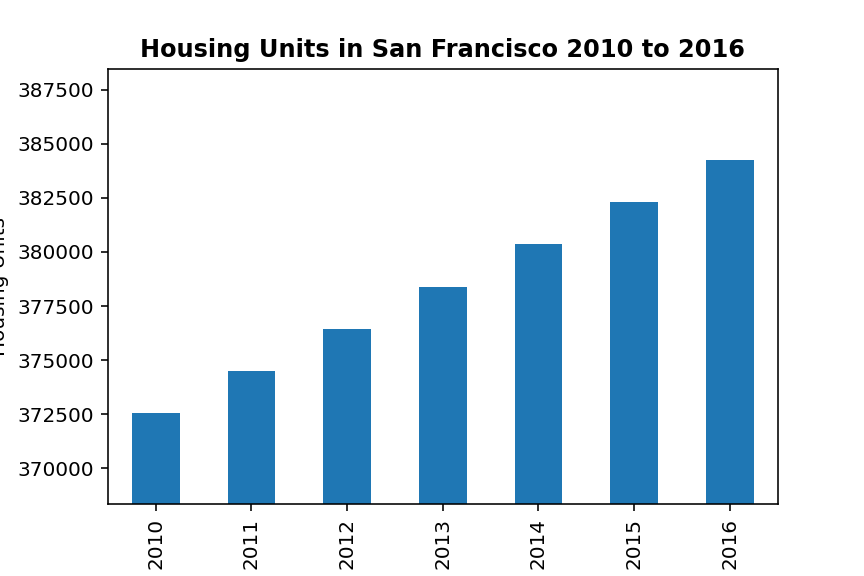
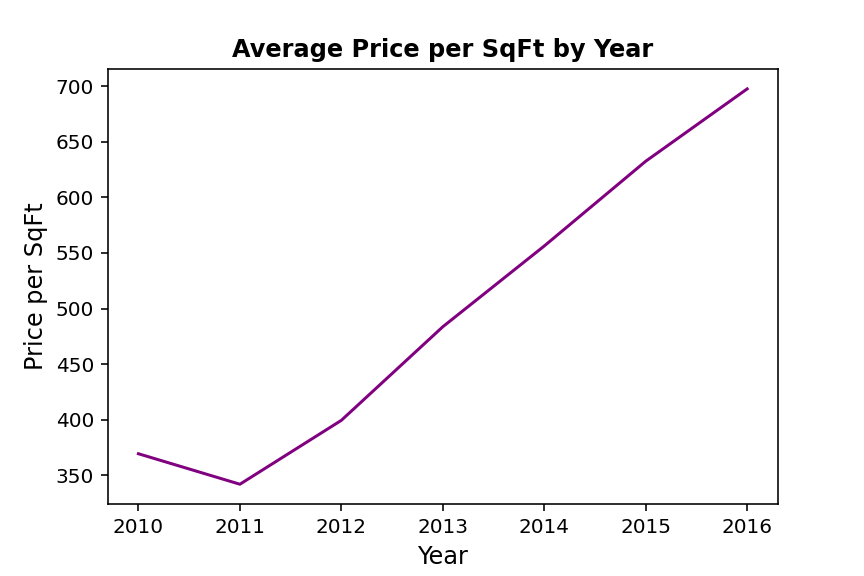
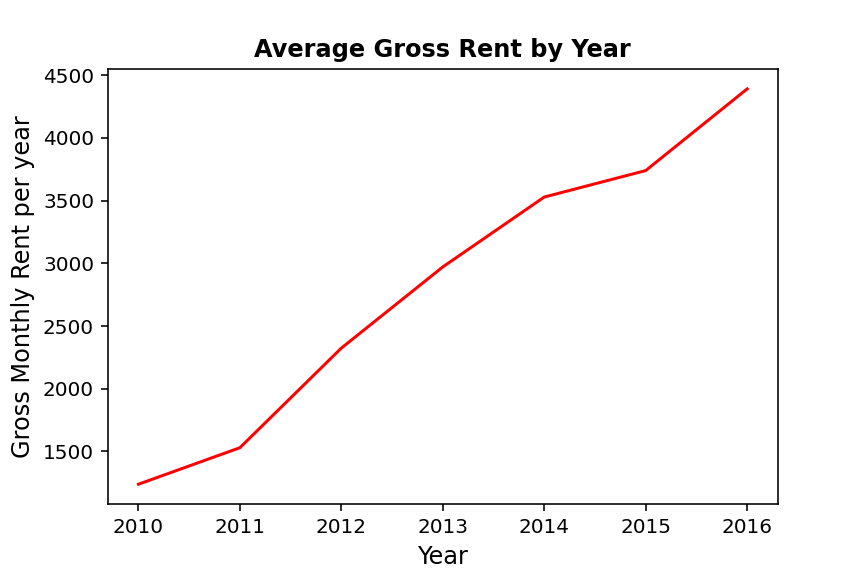

In [6]:
# Serve the# dashboard
real_estate_dashboard.servable()

# Debugging

Note: Some of the Plotly express plots may not render in the notebook through the panel functions.

However, you can test each plot by uncommenting the following code

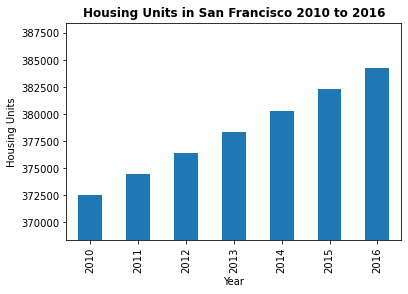

In [7]:
housing_units_per_year()

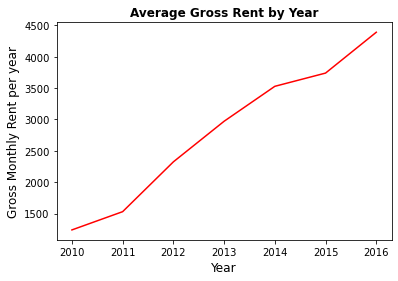

In [8]:
average_gross_rent()

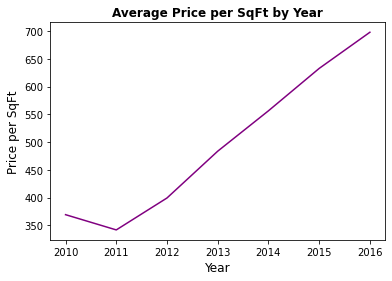

In [9]:
average_sales_price()

In [10]:
average_price_by_neighborhood()

:DynamicMap   [neighborhood]
   :Curve   [year]   (sale_price_sqr_foot)

In [11]:
top_most_expensive_neighborhoods()

:Bars   [neighborhood]   (sale_price_sqr_foot)

In [12]:
most_expensive_neighborhoods_rent_sales()

:DynamicMap   [neighborhood]
   :Bars   [year,Variable]   (value)

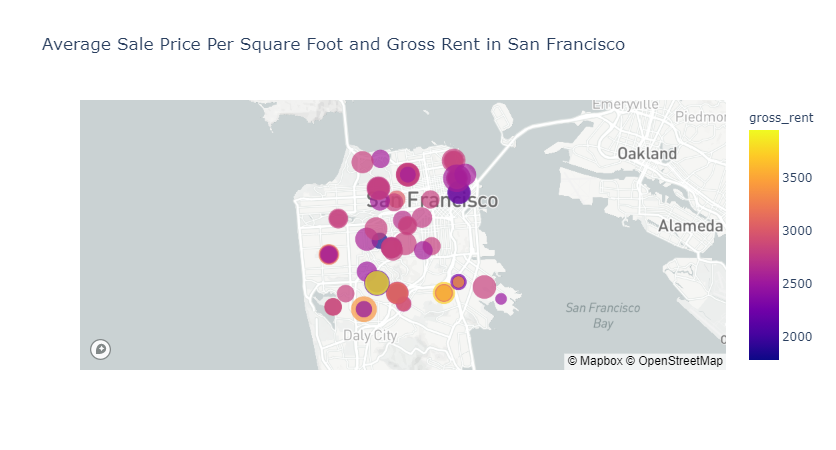

In [13]:
neighborhood_map().show()

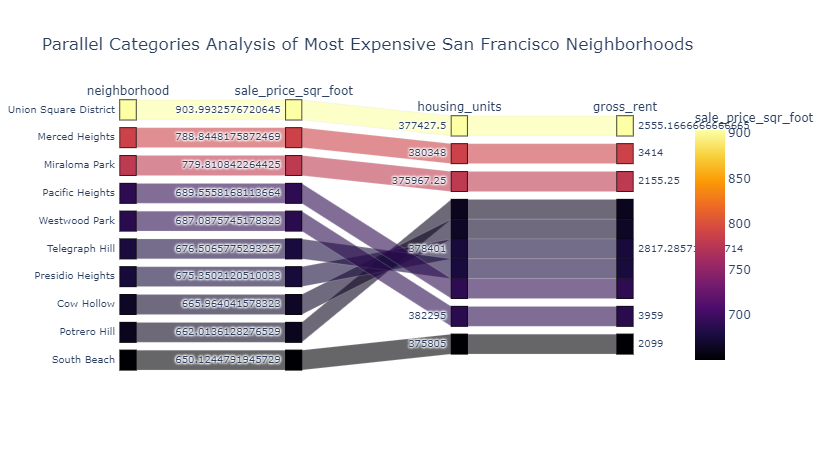

In [14]:
parallel_categories()

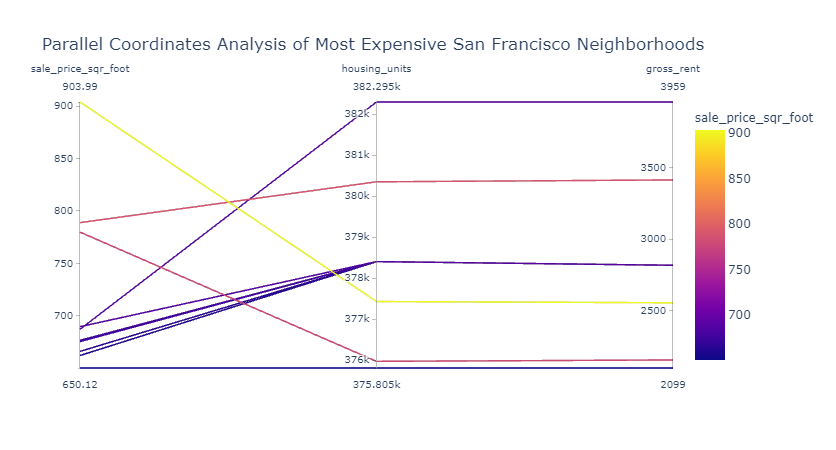

In [15]:
parallel_coordinates()

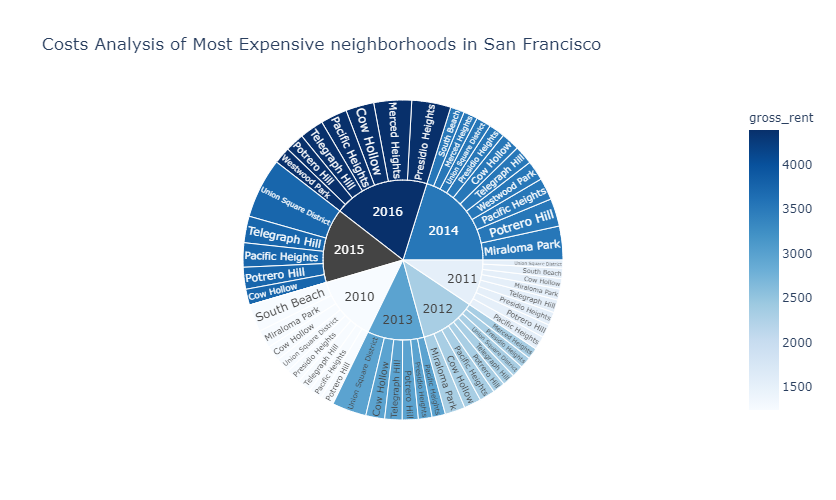

In [16]:
sunburst()